# BACKTESTING & ANALYSIS: RISK-ADJUSTED MOMENTUM

OUTLINE:

ANALYSIS PREPARATION:
- Import modules
- Set stable parameters
- import and clean data

FACTOR ANALYSIS:
- Visualize raw factor scores
- Normalize factor scores
- Conduct Information Coefficient Analysis (Spearman and Pearson Correlation)
- Calculate factor decay
- Calculate factor turnover

QUANTILE ANALYSIS:
- Split normalized factor scores into quantiles
- Calculate and examine quantile performance statistics
- Calculate quantile annual holdings turnover
- Calculate & examine quantile performance stats for different factor parameters

### ANALYSIS PREPARATION

#### IMPORT LIBRARIES

To keep the notebook clean, I have created a repository of the functions ("BackTestAnalytics"). This eventually could turn to a general registry package. For now, to use the function, you will have to added directly from my github. 

using Pkg

Pkg.add("https://github.com/georgegee23/BackTestAnalytics.jl.git")

Pkg.instantiate()


In [1]:
using BackTestAnalytics
using StatsBase, Statistics
using XLSX, DataFrames, TimeSeries, MarketData
using Plots, GR
theme(:dark)

#### SET PARAMETERS FOR SIMULATION

In [2]:
# We are using monthly data, let's set our annual period to 12
periods_per_year = 52

52

#### IMPORT & CLEAN DATA

In [3]:
end_date = DateTime("2025-01-10", "yyyy-mm-dd")
start_date = end_date - Year(27)
YOpt = YahooOpt(period1 = start_date, period2 = end_date, interval = "1wk", events = :history)

YahooOpt with 4 entries:
  :period1  => 884390400
  :period2  => 1736467200
  :interval => "1wk"
  :events   => :history

In [4]:
ticker_sector_dict = Dict("IYW"=>"Technology", "IYF"=>"Financials", "IYH"=>"Healthcare", "IYJ"=>"Industrials", "IYK"=>"Staples", 
"IYM"=>"Materials", "IYR"=>"Real Estate", "IYW"=>"Technology", "IYZ"=>"Telecom", "IDU"=>"Utilities", "IYC"=>"Discretionary", "IYE"=>"Energy")

Dict{String, String} with 11 entries:
  "IDU" => "Utilities"
  "IYC" => "Discretionary"
  "IYM" => "Materials"
  "IYW" => "Technology"
  "IYR" => "Real Estate"
  "IYJ" => "Industrials"
  "IYK" => "Staples"
  "IYE" => "Energy"
  "IYZ" => "Telecom"
  "IYH" => "Healthcare"
  "IYF" => "Financials"

In [5]:
ids = ["IYW", "IYF", "IYH", "IYC", "IYK", "IYE", "IDU", "IYJ", "IYM", "IYR", "IYZ"]

ts = yahoo(ids[1], YOpt)[:AdjClose]
for id in ids[2:end]
    ta = convert.(Float64, yahoo(id, YOpt)[:AdjClose])
    ts = merge(ts, ta)

end

prices_ts = TimeSeries.rename(ts, ids)
function fill_nan_with_last(arr)
    accumulate((x, y) -> isnan(y) ? x : y, arr)
end

prices_mtx = prices_ts |> values |> eachcol .|> fill_nan_with_last |> x -> hcat(x...)
prices = TimeSeries.TimeArray(timestamp(prices_ts), prices_mtx, colnames(prices_ts))

1279×11 TimeArray{Float64, 2, Date, Matrix{Float64}} 2000-07-10 to 2025-01-06
┌────────────┬─────────┬─────────┬─────────┬─────────┬─────────┬─────────┬──────
│            │ IYW     │ IYF     │ IYH     │ IYC     │ IYK     │ IYE     │ IDU ⋯
├────────────┼─────────┼─────────┼─────────┼─────────┼─────────┼─────────┼──────
│ 2000-07-10 │  29.315 │ 24.2456 │ 9.39733 │ 13.1947 │ 8.43791 │ 9.18576 │ 16. ⋯
│ 2000-07-17 │ 27.8287 │ 24.1118 │ 9.42277 │ 13.0394 │ 8.61488 │ 8.91682 │ 16. ⋯
│ 2000-07-24 │ 24.9941 │ 23.9764 │ 9.39053 │  12.402 │ 8.62232 │ 9.07221 │ 16. ⋯
│ 2000-07-31 │ 25.6262 │ 25.5855 │ 9.65421 │  12.347 │ 8.34398 │ 9.28138 │ 17. ⋯
│ 2000-08-07 │ 25.9928 │  25.943 │ 9.37204 │   13.02 │ 8.38193 │ 9.59814 │ 17. ⋯
│ 2000-08-14 │  27.748 │ 25.7593 │ 9.19625 │ 12.4958 │  8.4958 │ 10.0225 │   1 ⋯
│ 2000-08-21 │ 28.3802 │ 25.7245 │ 9.50618 │ 12.5347 │ 8.44519 │ 10.0942 │ 17. ⋯
│ 2000-08-28 │ 29.5235 │ 26.3353 │ 9.47843 │ 12.3599 │ 8.26174 │ 10.1838 │ 18. ⋯
│     ⋮      │    ⋮    │    ⋮  

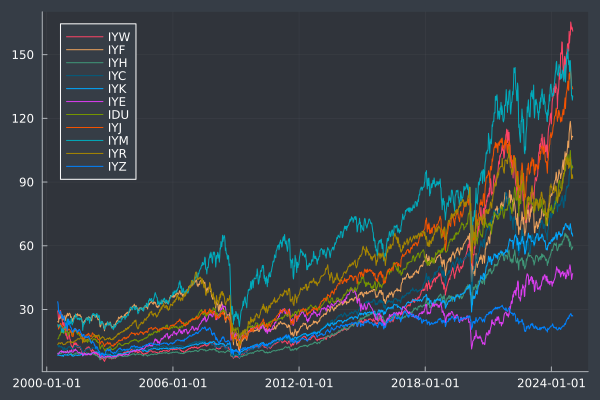

In [6]:
prices |> Plots.plot

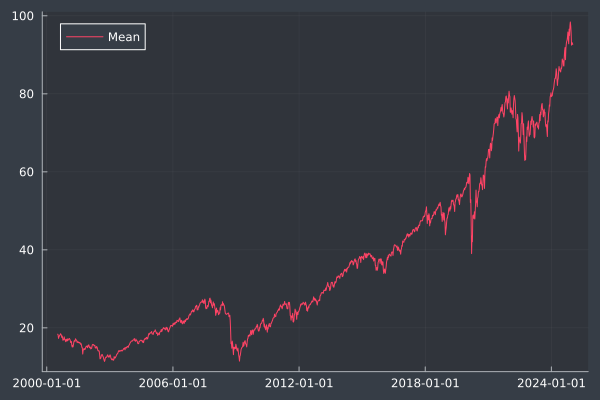

In [7]:
eqw_idx = row_mean(prices_ts)
Plots.plot(eqw_idx)

In [8]:
sector_returns = pct_change(prices, 1)[2:end]
eqw_returns = pct_change(eqw_idx, 1)[2:end]

1278×1 TimeArray{Float64, 1, Date, Vector{Float64}} 2000-07-17 to 2025-01-06
┌────────────┬─────────────┐
│            │ Mean        │
├────────────┼─────────────┤
│ 2000-07-17 │  -0.0114402 │
│ 2000-07-24 │  -0.0474869 │
│ 2000-07-31 │   0.0266192 │
│ 2000-08-07 │  0.00623219 │
│ 2000-08-14 │   0.0137262 │
│ 2000-08-21 │  0.00424064 │
│ 2000-08-28 │   0.0167679 │
│ 2000-09-04 │ -0.00885911 │
│     ⋮      │      ⋮      │
│ 2024-11-25 │   0.0104816 │
│ 2024-12-02 │  -0.0104203 │
│ 2024-12-09 │  -0.0176538 │
│ 2024-12-16 │  -0.0333682 │
│ 2024-12-23 │  0.00737553 │
│ 2024-12-30 │ -0.00198106 │
│ 2025-01-06 │ -0.00339307 │
└────────────┴─────────────┘
           1263 rows omitted

### FACTOR ANALYSIS: CROSS-SECTIONAL MOMENTUM

Let's create a function to compute our factor scores. In this case, we will be calculating the risk-adjusted momentum. 

The function:
1. Calculate synthetic equity prices from returns data.
2. Calculate percentage change for a given window.
3. Optional: Shift percentage change dataframe to account for short-term reversal effect.

In [9]:
function momentum(prices::TimeArray, window::Int, reversal_period::Int = 0)
    """
    
    Calculates the momentum of price changes over a specified window, with an optional
    lag to account for short-term reversal effects.

    # Arguments
    - `prices::TimeArray`: A TimeArray containing return data.
    - `window::Int`: The number of periods to calculate the momentum over.
    - `reversal_period::Int`: Number of periods to lag the momentum, capturing reversal effects. Default is 0.

    # Returns
    - `TimeArray`: A time series of momentum values, potentially lagged.

    # Throws
    - `ArgumentError`: If `window` or `reversal_period` are not positive integers.
    - `Error`: If the operation on the `TimeArray` fails.
    """

    # Check for valid inputs
    if window <= 0 || reversal_period < 0
        throw(ArgumentError("Window and reversal period must be positive integers"))
    end

    try
        # Calculate percentage change
        pct_chg = pct_change(prices, window)[1+window:end]
        
        # Lag the percentage change if needed
        pct_chg_lagged = lag(pct_chg, reversal_period)
        
        return pct_chg_lagged
    catch e
        # Handle any errors from TimeSeries.jl functions or data manipulation
        throw(ErrorException("An error occurred while processing the prices: $e"))
    end
end

function riskadj_momentum(prices::TimeArray, window::Int, reversal_period::Int = 0)
    """
    
    Calculates the rolling average momentum of price changes over a specified window, with an optional
    lag to account for short-term reversal effects.

    # Arguments
    - `prices::TimeArray`: A TimeArray containing return data.
    - `window::Int`: The number of periods to calculate the momentum over.
    - `reversal_period::Int`: Number of periods to lag the momentum, capturing reversal effects. Default is 0.

    # Risk-Adjusted Returns
    - `TimeArray`: A time series of risk-adjusted momentum values, potentially lagged.

    # Throws
    - `ArgumentError`: If `window` or `reversal_period` are not positive integers.
    - `Error`: If the operation on the `TimeArray` fails.
    """

    mom = momentum(prices, window, reversal_period)
    returns = lag(pct_change(prices, 1), reversal_period)
    mom_std = moving(std, returns, window)

    ramom = mom ./ mom_std

    return TimeSeries.rename(ramom, colnames(prices))

end

window = 52
factor_scores = riskadj_momentum(prices, window)

1227×11 TimeArray{Float64, 2, Date, Matrix{Float64}} 2001-07-09 to 2025-01-06
┌────────────┬──────────┬───────────┬───────────┬───────────┬────────────┬──────
│            │ IYW      │ IYF       │ IYH       │ IYC       │ IYK        │ IYE ⋯
├────────────┼──────────┼───────────┼───────────┼───────────┼────────────┼──────
│ 2001-07-09 │ -7.89243 │   4.21985 │  -1.57227 │   -1.3653 │   -0.13337 │  0. ⋯
│ 2001-07-16 │ -7.85345 │   3.91169 │  -0.59169 │  -1.19509 │  -0.285365 │   1 ⋯
│ 2001-07-23 │  -7.2252 │   4.25547 │ -0.885932 │ 0.0884271 │   -1.07904 │   2 ⋯
│ 2001-07-30 │ -7.13089 │   2.67339 │  -1.55967 │  0.450678 │   0.715841 │   0 ⋯
│ 2001-08-06 │ -7.60932 │   1.56651 │ -0.684885 │   -1.7112 │   0.728351 │ -0. ⋯
│ 2001-08-13 │ -8.47595 │   1.17099 │ -0.254276 │  -1.72182 │   0.764919 │  -1 ⋯
│ 2001-08-20 │ -8.41928 │   1.26055 │  -0.28399 │  -1.42273 │    2.59315 │  -1 ⋯
│ 2001-08-27 │ -9.03022 │ -0.688402 │   -1.4519 │  -2.24364 │    3.05134 │  -2 ⋯
│     ⋮      │    ⋮     │     ⋮

#### VISUALIZE FACTOR SCORES

We can see that the mean factor scores of securities declined in periods of market upturns like 2008. 

Let's look at the raw factor score for iShares U.S. Technology ETF (IYW).

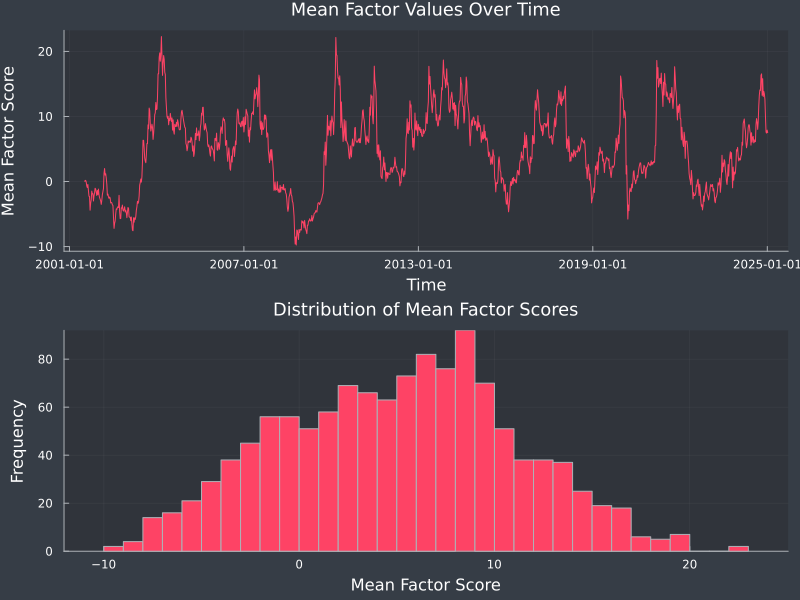

In [10]:
plot_factor_distribution(factor_scores, bins = 50)

#### NORMALIZE FACTOR SCORES USING PERCENTILES

There are various methods for normalizing data. Standard industry practice is to use z-scores, but I will use percentile rank here.

The percentile rank is a non-parametric statistic, meaning it does not make assumptions about the underlying distribution of the data. It describes the position of a value within any dataset, regardless of whether it's normal, skewed, bimodal, or any other shape.

In [11]:
factor_perc = rowwise_tied_pctrank(factor_scores)

1227×11 TimeArray{Float64, 2, Date, Matrix{Float64}} 2001-07-09 to 2025-01-06
┌────────────┬───────────┬──────────┬──────────┬──────────┬──────────┬──────────
│            │ IYW       │ IYF      │ IYH      │ IYC      │ IYK      │ IYE     ⋯
├────────────┼───────────┼──────────┼──────────┼──────────┼──────────┼──────────
│ 2001-07-09 │  0.181818 │ 0.818182 │ 0.363636 │ 0.454545 │ 0.545455 │  0.6363 ⋯
│ 2001-07-16 │  0.181818 │ 0.909091 │ 0.454545 │ 0.363636 │ 0.545455 │  0.6363 ⋯
│ 2001-07-23 │ 0.0909091 │ 0.909091 │ 0.454545 │ 0.545455 │ 0.363636 │  0.7272 ⋯
│ 2001-07-30 │  0.181818 │ 0.818182 │ 0.363636 │ 0.454545 │ 0.545455 │  0.6363 ⋯
│ 2001-08-06 │  0.181818 │ 0.818182 │ 0.454545 │ 0.363636 │ 0.727273 │  0.5454 ⋯
│ 2001-08-13 │ 0.0909091 │ 0.818182 │ 0.636364 │ 0.363636 │ 0.727273 │  0.5454 ⋯
│ 2001-08-20 │ 0.0909091 │ 0.727273 │ 0.636364 │ 0.454545 │ 0.818182 │  0.3636 ⋯
│ 2001-08-27 │  0.181818 │ 0.727273 │ 0.636364 │ 0.454545 │ 0.818182 │  0.3636 ⋯
│     ⋮      │     ⋮     │    ⋮

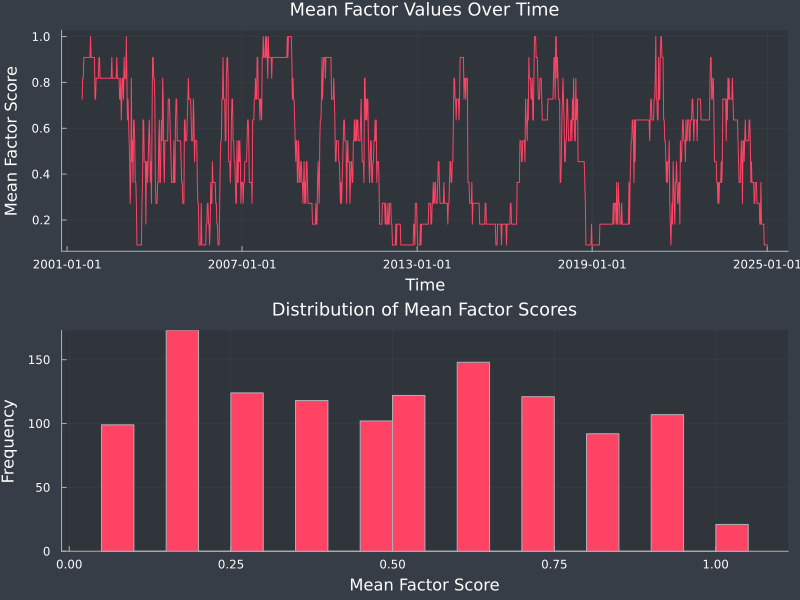

In [12]:
plot_factor_distribution(factor_perc[:IYM])

Let's axamine the most recent factor scores by sector:

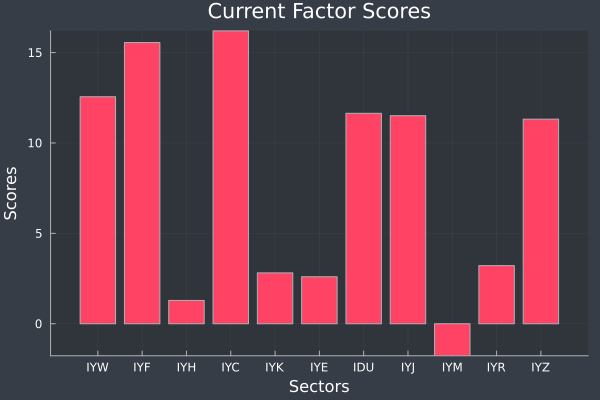

In [13]:
window = 52
factor_scores = riskadj_momentum(prices[1:end-1], window)

x = values(factor_scores[end]) |> vec
y = string.(colnames(factor_scores)) 

# Plot the bar chart
Plots.bar(y, x, title="Current Factor Scores", xlabel="Sectors", ylabel="Scores", legend=false)

#### SPEARMAN RANK & PEARSON CORRELATION (INFORMATION COEFFICIENT ANALYSIS)

Next, we will lag our factor percentile scores one period back (one month). The Spearman correlation will tell us how correlated the month's returns are to the prior month's factor percentile score. 

In [14]:
factor_perc = rowwise_tied_pctrank(factor_scores)

n_lags = 1
factor_perc_lag = lag(factor_perc, n_lags)
returns_aligned = pct_change(prices[1:end-1], 1)[1+window+n_lags:end]

spearmanrank_corrs = rows_spearmanr(factor_perc_lag, returns_aligned)
mean(spearmanrank_corrs)

1×1 TimeArray{Float64, 1, Date, Vector{Float64}} 2024-12-30 to 2024-12-30
┌────────────┬─────────────────┐
│            │ SpearmanRank_IC │
├────────────┼─────────────────┤
│ 2024-12-30 │       0.0212199 │
└────────────┴─────────────────┘

There is a slight positive correlation between the 52-week momentum scores and subsequent weekly returns, but overall, that correlation is low. However, let's plot the time series.

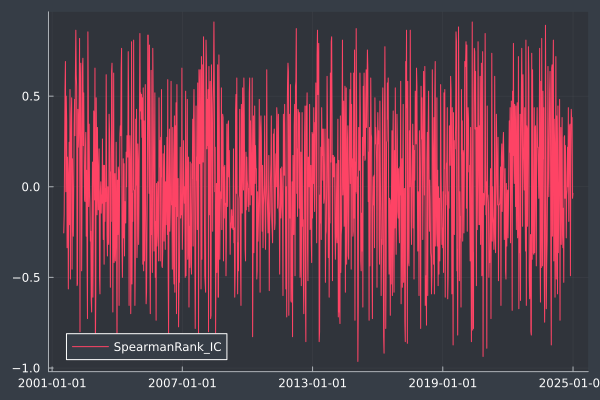

In [15]:
Plots.plot(spearmanrank_corrs)

The time series also does not show a distiguisable pattern. Let's plot a rolling mean spearman rank correlation. 

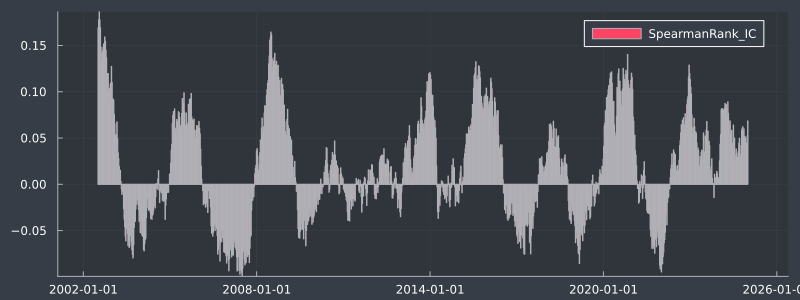

In [17]:
sr_corrs_mov12 = moving(mean, spearmanrank_corrs, 52)
Plots.bar(sr_corrs_mov12, size = (800, 300))

The Spearman correlation is not highly consistent on a 1-year rolling basis. There were times when the correlation between factor percentiles and subsequent returns was negative. Let's see if we can improve the consistency of the factor by using a longer momentum window. 

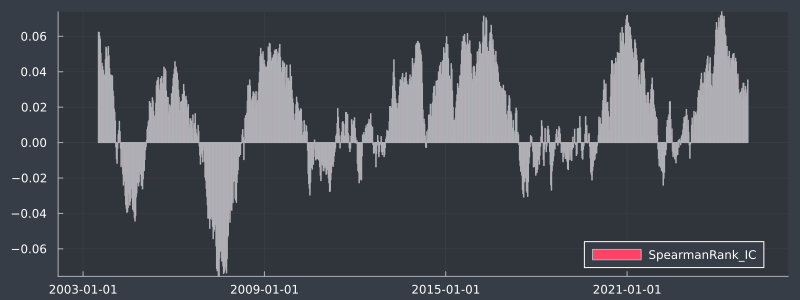

In [18]:
sr_corrs_mov12 = moving(mean, spearmanrank_corrs, 104)
Plots.bar(sr_corrs_mov12, size = (800, 300))

The Spearman correlation is not highly consistent on a 1-year rolling basis. There were times when the correlation between factor percentiles and subsequent returns was negative.   

Next, let's compute the mean spearman rank and pearson correlations for different momentum windows. We will calculate each window's momentum score, convert it to a percentile, and then lag it back one month. 

In [19]:
sector_returns = pct_change(prices, 1)
window_mean_spearman_corrs = Dict{Int, Float64}()
window_mean_pearson_corrs = Dict{Int, Float64}()
n_lags = 1
for window in 2:226

    w_factor = riskadj_momentum(prices, window)
    w_factor_perc = rowwise_tied_pctrank(w_factor)
    w_factor_perc_lagged = lag(w_factor_perc, n_lags)
    dates = timestamp(w_factor_perc_lagged)

    w_returns = sector_returns[dates]
    window_mean_spearman_corrs[window] = rows_spearmanr(w_factor_perc_lagged, w_returns) |> values |> fill_nan_with_last|> mean
    window_mean_pearson_corrs[window] = rows_pearsonr(w_factor_perc_lagged, w_returns) |> values |> fill_nan_with_last|> mean
end
window_mean_spearman_corrs = sort(window_mean_spearman_corrs)
window_mean_pearson_corrs = sort(window_mean_pearson_corrs)

OrderedCollections.OrderedDict{Int64, Float64} with 225 entries:
  2  => -0.00806358
  3  => -0.00431773
  4  => -0.010252
  5  => -0.00904864
  6  => -0.00411221
  7  => -0.00836366
  8  => -0.00697024
  9  => 0.00201944
  10 => -0.00426705
  11 => -0.0068496
  12 => -0.00629271
  13 => 0.000245218
  14 => 0.00346306
  15 => 0.00554673
  16 => 0.00522585
  17 => 0.00871972
  18 => 0.00915962
  19 => -0.000484257
  20 => -0.000168141
  ⋮  => ⋮

Pearson correlation is affected by outliers, but let's plot it and compute it, as well:

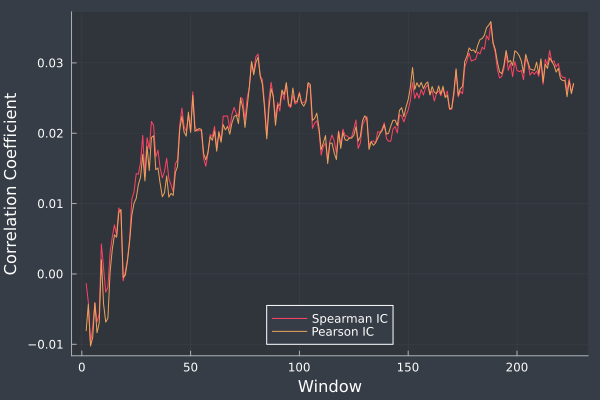

In [20]:
# Plot the spearman rank and pearson correlation coefficient for each window size
windows_vec = collect(keys(window_mean_spearman_corrs))
spearman_corrs_vec = collect(values(window_mean_spearman_corrs))
pearson_corr_vec = collect(values(window_mean_pearson_corrs))

Plots.plot(windows_vec, 
[spearman_corrs_vec pearson_corr_vec], labels = ["Spearman IC" "Pearson IC"], 
legend=:bottom, xlabel = "Window", ylabel = "Correlation Coefficient")

The correlation between factor percentile scores and subsequent returns is negative for anything below a 12-week window. This is probably due to what is known in finance literature as momentum's Short-Term Reversal Effect. It typically occurs when stocks have experienced extreme price changes in a very short period and reverse direction. However, there does appear to be a correlation between percentile rank of factor scores and subsequent returns. 

#### FACTOR DECAY

Factor decay measures the decline in a factor's predictive power as the forecasting horizon (or backtesting history) is extended.

In [21]:
window = 52

factor_perc = riskadj_momentum(prices, window) |> rowwise_tied_pctrank
returns = sector_returns[1+window:end]

factor_decays = spearman_factor_decay(factor_perc, returns, 52)

OrderedCollections.OrderedDict{Int64, Float64} with 52 entries:
  1  => 0.0209431
  2  => 0.0207861
  3  => 0.02344
  4  => 0.023151
  5  => 0.0191674
  6  => 0.0171841
  7  => 0.0209095
  8  => 0.0196697
  9  => 0.0222051
  10 => 0.0194183
  11 => 0.0216169
  12 => 0.0211518
  13 => 0.0222103
  14 => 0.022768
  15 => 0.0213658
  16 => 0.0226665
  17 => 0.0210445
  18 => 0.0188923
  19 => 0.0170899
  ⋮  => ⋮

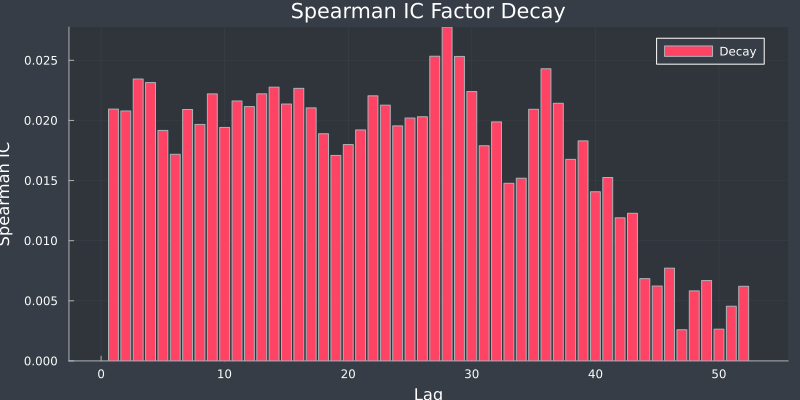

In [22]:
Plots.bar(factor_decays, labels = "Decay", title = "Spearman IC Factor Decay", ylabel = "Spearman IC", xlabel = "Lag", size = (800,400))

It look's like the factor's predictive power declines after 40 weeks. 

#### FACTOR TURNOVER (AUTOCORRELATION)

To isolate the effect of factor changes from portfolio construction, signal autocorrelation (i.e., serial correlation is commonly used to measure factor turnover. Signal autocorrelation is computed as the correlation between the vector of today's (t) factor scores and the factor scores from the preceding period (t – 1):

a.	Data should not have inner data gaps. Missing or NaN values are allowed if they occur at the beginning or/and of a time series.  

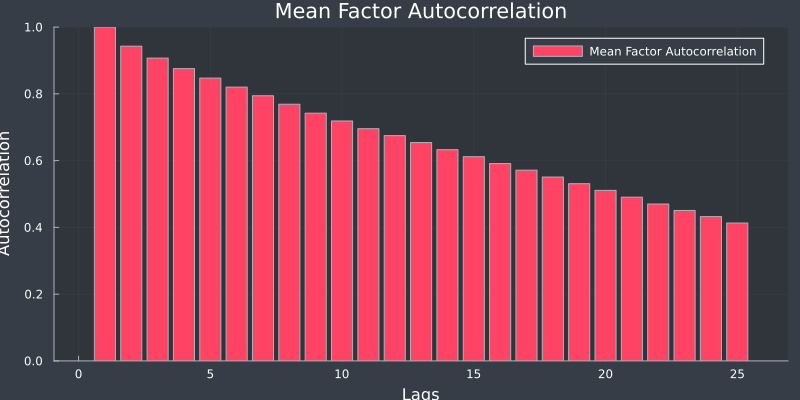

In [23]:
mu_factors_autocors = mean_autocor(factor_perc, 24)
Plots.bar(mu_factors_autocors, size = (800, 400), title = "Mean Factor Autocorrelation", xlabel = "Lags", ylabel = "Autocorrelation", label ="Mean Factor Autocorrelation")

The momentum factor has a high turnover rate. One way to reduce that turnover could be to extend the window. Let's consider a 24-month momentum window. 

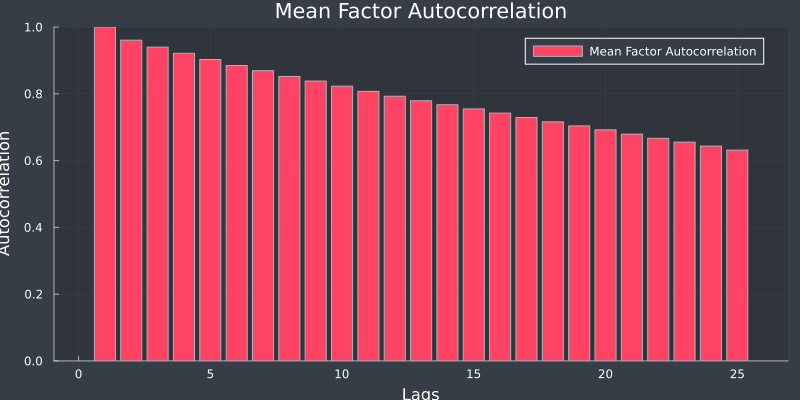

In [24]:
window = 104
factor_perc_24M = riskadj_momentum(prices, window)|> rowwise_tied_pctrank

mu_factors_autocors = mean_autocor(factor_perc_24M, 24)
Plots.bar(mu_factors_autocors, size = (800, 400), title = "Mean Factor Autocorrelation", xlabel = "Lags", ylabel = "Autocorrelation", label ="Mean Factor Autocorrelation")

Using a larger window for momentum will decrease the factor decay.

Let's also take a look at the mean rolling factor autocorrelation. 

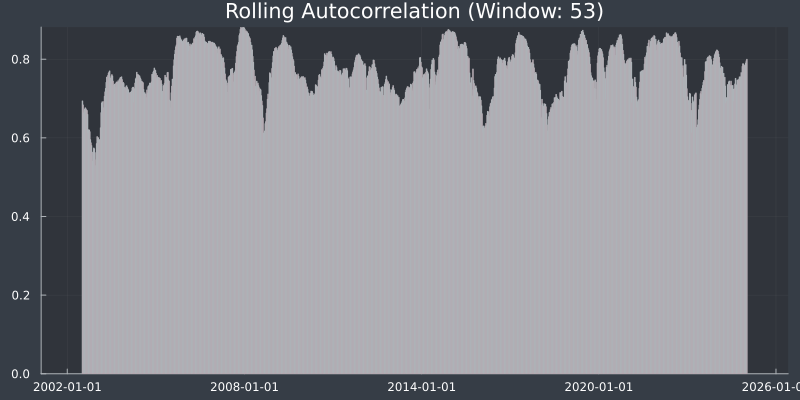

In [25]:
maxlags, acf_window = 52, 53
rolling_mu_acfs = rolling_mean_autocor(factor_perc, maxlags, acf_window)
Plots.bar(rolling_mu_acfs["ACF1"], size = (800, 400), title = "Rolling Autocorrelation (Window: $acf_window)", label="")

### QUANTILE ANALYSIS

#### QUANTILE PERFORMANCE COMPARISON

Another way to examine a factor's performance is to break up security factor score percentiles into different lagged quantiles and examine the performance of each quantile. 

First, let's check how many securities we should expect for each quantile:

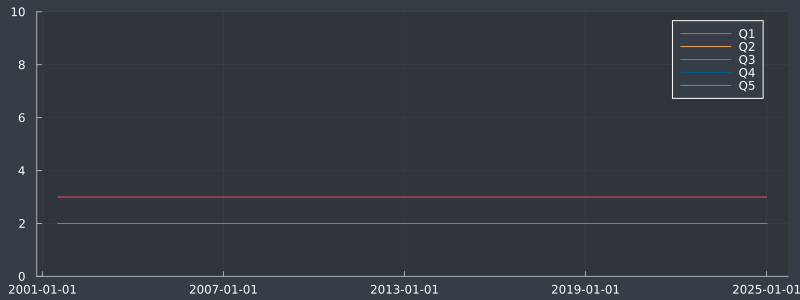

In [32]:
window = 52
n_quantiles = 5
quantiles = riskadj_momentum(prices, window) |> rowwise_tied_pctrank |> factors -> rowwise_quantiles(factors, n_quantiles)

securities_per_quantile = rowwise_countall(quantiles)
Plots.plot(securities_per_quantile, labels = ["Q1" "Q2" "Q3" "Q4" "Q5"], size = (800,300), ylimit = (0, 10))

Since there are 11 sectors, quantile 1 will contain 3 sector etfs, while the other for quantiles will contain 2 sector etfs. 

8×6 DataFrame
 Row │ Stat             Q1         Q2         Q3         Q4        Q5        
     │ String           Float64    Float64    Float64    Float64   Float64   
─────┼───────────────────────────────────────────────────────────────────────
   1 │ Annual Return      6.68313    7.81104   10.0342    6.59597    9.24273
   2 │ Annual StDev      20.3215    20.8043    19.744    17.8174    18.4269
   3 │ Sharpe Ratio      32.887     37.5452    50.8217   37.0197    50.1589
   4 │ Sortino Ratio      5.56571    6.19466    7.73942   5.67295    7.02893
   5 │ Max Drawdowns     57.2791    59.8435    45.3423   61.3936    57.2826
   6 │ Down Capture     105.49     102.341     91.1232   89.5756    80.3245
   7 │ Up Capture       103.441    103.149     97.6373   89.312     86.8979
   8 │ Overall Capture   98.0575   100.789    107.149    99.7057   108.184


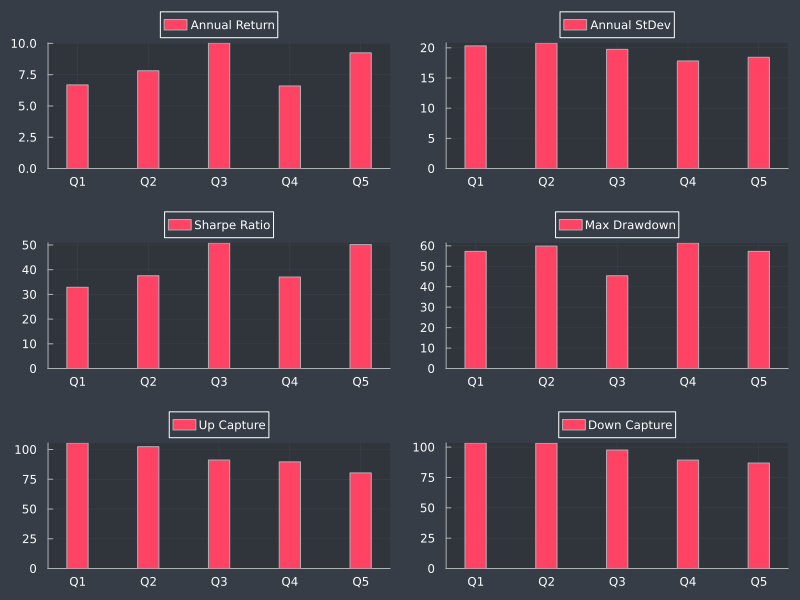

In [33]:
n_lags = 1

quantiles_lagged = lag(quantiles, n_lags)
qlag_dates = timestamp(quantiles_lagged)
w_returns = sector_returns[qlag_dates]
quantiles_returns = compute_quantiles_returns(quantiles_lagged, w_returns, n_quantiles)

bk_rets = eqw_returns[qlag_dates]
q_perf_table = quantile_performance_table(quantiles_returns, bk_rets, periods_per_year = periods_per_year)

println(q_perf_table)
plot_performance_table(q_perf_table)

Next, let's calculate performance statistics for the quantiles and visualize them:

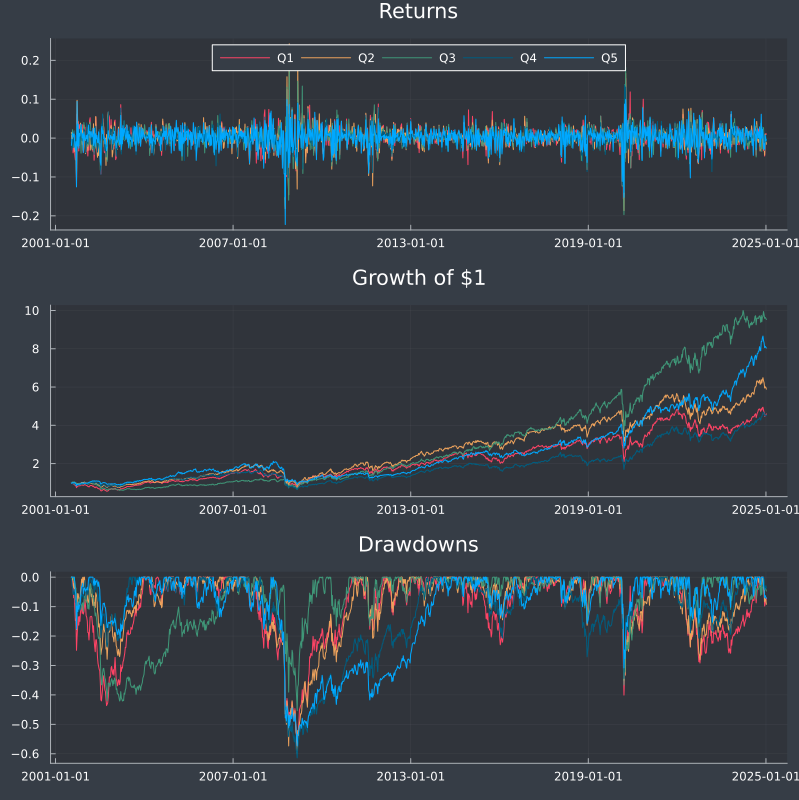

In [34]:
p1 = Plots.plot(quantiles_returns, legend=:top, legend_columns = -1)
p2 = quantiles_returns |> returns_to_prices |> x -> Plots.plot(x, legend=false)
p3 = quantiles_returns |> drawdowns |> x -> Plots.plot(x, legend=false)
# Combine plots into a 2x1 subplot
Plots.plot(p1, p2, p3, layout = (3, 1), size = (800,800), title = ["Returns" "Growth of \$1" "Drawdowns"])

The results are pretty interesting. The middle quantile (Q3) was actually the top-performing. Q1 was the second best but performed poorly during the 2008 crash, as it recovered much slower. 

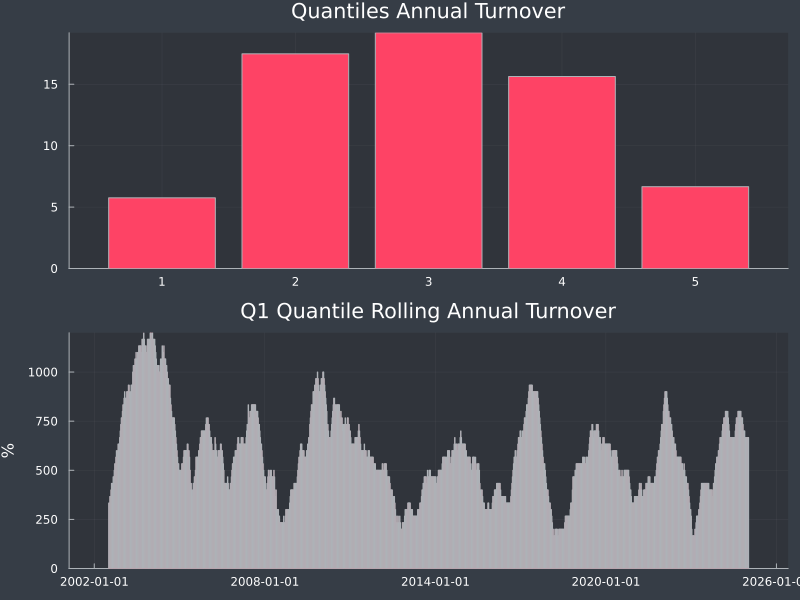

In [35]:
q_turnover = quantiles_turnover(quantiles) 
qs_plots = q_turnover .*periods_per_year |> mean |> values |> vec |> x -> Plots.bar(x, title = "Quantiles Annual Turnover", label = "")
rolling_annual_turnover = moving(sum, q_turnover["Q1"], periods_per_year) .* 100
rolling_q1to_plot = Plots.bar(rolling_annual_turnover, title = "Q1 Quantile Rolling Annual Turnover", label = "", ylabel = "%")
Plots.plot(qs_plots, rolling_q1to_plot, layout = (2, 1), size = (800,600))

We can expect very high annual turnover (above 500%) if we only invest in the top quantile. 

#### RISK & RETURN STATISTICS FOR DIFFERENT RISK-ADJUST MOMENTUM WINDOWS

Here, we will plot some risk statistics based on the momentum window. However, let's use three quantiles instead of 5 to make the visual easier to read.

In [41]:
n_lag = 1
n_quantiles = 3
periods_per_year = 52

annual_returns_dict = Dict{Int64, Vector{Float64}}()
annual_std_dict = Dict{Int64, Vector{Float64}}()
sharpe_ratio_dict = Dict{Int64, Vector{Float64}}()  
max_dds_dict = Dict{Int64, Vector{Float64}}()
uc_ratio_dict = Dict{Int64, Vector{Float64}}() 
dc_ratio_dict = Dict{Int64, Vector{Float64}}()

for window in 6:208   

    w_factor_perc = riskadj_momentum(prices, window) |> rowwise_tied_pctrank
    w_quantiles = rowwise_quantiles(w_factor_perc, n_quantiles) # Compute the quantiles from the lagged factors)
    w_quantiles_lagged = TimeSeries.lag(w_quantiles, n_lag)

    w_returns = sector_returns[1+window+n_lags:end]

    w_quantiles_rets = compute_quantiles_returns(w_quantiles_lagged, w_returns, n_quantiles)
    w_bk_returns = eqw_returns[timestamp(w_quantiles_rets)]

    annual_returns_dict[window] = annual_return(w_quantiles_rets, periods_per_year)
    annual_std_dict[window] = annual_stdev(w_quantiles_rets, periods_per_year)
    sharpe_ratio_dict[window] = annual_sharpe_ratio(w_quantiles_rets, periods_per_year)
    max_dds_dict[window] = max_drawdown(w_quantiles_rets)
    uc_ratio_dict[window] = up_capture(w_quantiles_rets, w_bk_returns, 0)
    dc_ratio_dict[window] = down_capture(w_quantiles_rets, w_bk_returns, 0)

end

In [46]:
function dict_to_rowframe(dict, col_names)

    """

    Convert a dictionary to a DataFrame row-wise, where the keys are rows. 

    """

    df = DataFrame(collect(values(dict)), :auto)
    df = permutedims(df)
    df = DataFrames.rename(df, col_names)
    df[!, "Key"] = collect(keys(dict))
    df = sort(df, :Key)
    return df
end

dict_to_rowframe (generic function with 1 method)

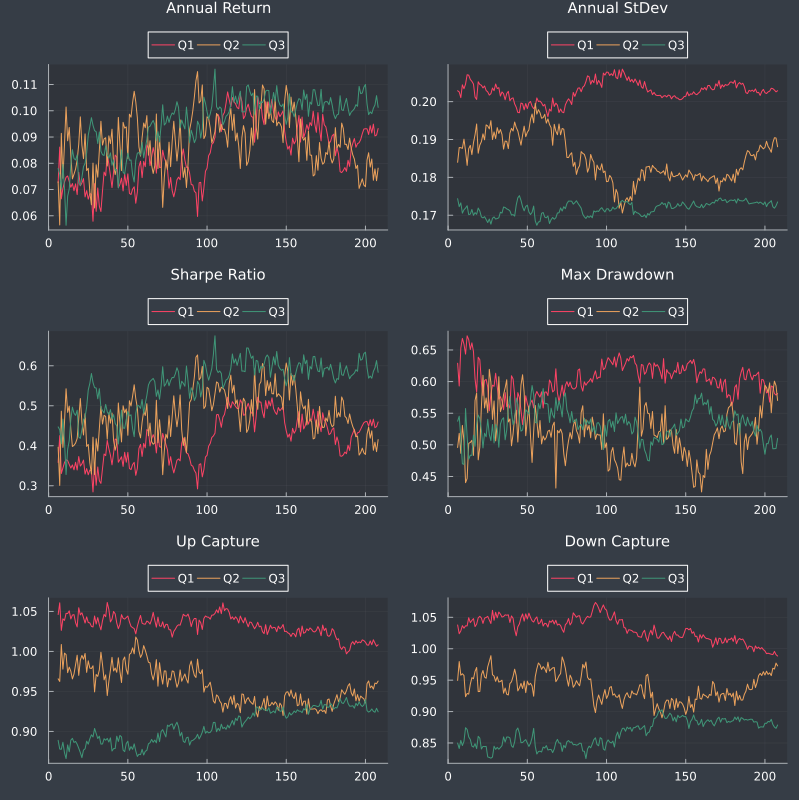

In [47]:
quantile_names = ["Q"*string(i) for i in 1:n_quantiles]

window_stat_dict = Dict{String, DataFrame}()
window_stat_dict["Annual Return"] = dict_to_rowframe(annual_returns_dict, quantile_names)
window_stat_dict["Annual StDev"] = dict_to_rowframe(annual_std_dict, quantile_names)
window_stat_dict["Sharpe Ratio"] = dict_to_rowframe(sharpe_ratio_dict, quantile_names)
window_stat_dict["Max Drawdown"] = dict_to_rowframe(max_dds_dict, quantile_names)
window_stat_dict["Up Capture"] = dict_to_rowframe(uc_ratio_dict, quantile_names)
window_stat_dict["Down Capture"] = dict_to_rowframe(dc_ratio_dict, quantile_names)


plots_dict = Dict{String, Plots.Plot}()
names_quantiles = names(window_stat_dict["Annual Return"][:, Not("Key")])
names_quantiles = permutedims(names_quantiles)

for (stat_name, df) in pairs(window_stat_dict)

    x_axis = @view df[:, "Key"]
    y_axis = Matrix(df[:, Not("Key")])
    plots_dict[stat_name] = Plots.plot(x_axis, y_axis; size = (600, 300),
    title = stat_name, titlefontsize=10, labels = names_quantiles)
end

theme(:dark)

# Combine all plots
layout = (3,2)
combined_plot = Plots.plot(plots_dict["Annual Return"], plots_dict["Annual StDev"], plots_dict["Sharpe Ratio"], 
plots_dict["Max Drawdown"], plots_dict["Up Capture"], plots_dict["Down Capture"], 
layout=layout, legend=:outertop, legendcolumns=length(quantile_names), size=(800, 800))

Quantile 1 (with the least momentum) underperforms the other quantiles on almost all measures for our momentum percentile score. Nonetheless, the other two quantiles performed well during the examined period. It does appear that a longer window might be beneficial. 